#### Capstone code is developed and executed in google colab
#### MRI T1 and T2 images are placed in drive at location : `COURSE/MRI/` and drive connected to colab for data ingestion and model training

#### Please alter path accordingly to run code successfully

In [ ]:
# Import necessary packages

import numpy as np
import tensorflow as tf
import matplotlib.pyplot as plt
from skimage.transform import resize
from keras.utils.vis_utils import plot_model
import imageio
import glob, tqdm
from PIL import Image

In [ ]:
# connect to drive to access MRI T1-T2 dataset

from google.colab import drive
drive.mount("/content/drive")

Mounted at /content/drive


In [ ]:
# check paths where MRI T1-T2 images are present

import glob

base_dir = "/content/drive/MyDrive/COURSE/MRI"
paths = glob.glob(f"{base_dir}/*/*")
paths

['/content/drive/MyDrive/COURSE/MRI/Tr1/TrainT1',
 '/content/drive/MyDrive/COURSE/MRI/Tr2/TrainT2']

In [ ]:
# check size of an image in the dataset

import cv2

imgs = glob.glob(f"{paths[0]}/*.png")
cv2.imread(imgs[0]).shape

(217, 181, 3)

#### The closest size to which image can be resized so that it can be ingested in style transfer model without downsampling/upsampling dimension issues is [224, 192] : both dimensions being a multiple of 32 

In [ ]:
# Initialise hyperparameters

EPOCHS = 100

BATCH_SIZE = 1      # for initial dataloader testing, is altered for training later
SIZE = (224, 192)   # target size to which raw images are to be resized

In [ ]:
# Dataset Implementation for MRI T1-T2 dataset

class MRIDataset:
    # constructor
    def __init__(self, size, img_paths, train=True):
        self.train = train
        self.h, self.w = size

        # img_pairs to contain all possible T1-T2 image pairs 
        img_t1_paths, img_t2_paths = [glob.glob(f"{path}/*") for path in img_paths]
        self.img_pairs = [(img_t1, img_t2) for img_t1 in img_t1_paths for img_t2 in img_t2_paths]

        print(f"Number of samples : {len(self.img_pairs)}")

    # retrieves an item from dataset
    def __getitem__(self, idx):
        imgs = [Image.open(im_path).convert("RGB") for im_path in self.img_pairs[idx]]
        t1_tnsr, t2_tnsr = [tf.keras.utils.img_to_array(img) for img in imgs]

        return t1_tnsr, t2_tnsr

    # returns number of samples in dataset
    def __len__(self):
        return len(self.img_pairs)

    # generator for sample retrieval from dataset.
    # to be used in __getGenerator__() method which in turn is used for dataset interleaving
    def __getitemgen__(self, idx):
        yield self.__getitem__(idx)

    # returns dataset created through item generator for interleaving
    def __getGenerator__(self, idx):
        return tf.data.Dataset.from_generator(
            self.__getitemgen__, args=(idx,),
            output_signature=(tf.TensorSpec(shape=(None, None, 3), dtype=tf.float32),
                              tf.TensorSpec(shape=(None, None, 3), dtype=tf.float32)))

    # image augmentation routine    
    @tf.function
    def augment(self, t1_tnsr, t2_tnsr):
        hr_flip = tf.random.uniform(()) > 0.5  # horizontal flip probability

        # resize images to target shape
        t1_tnsr, t2_tnsr = [tf.image.resize(tnsr,[self.h, self.w]) for tnsr in [t1_tnsr, t2_tnsr]]
        
        # normalize image intensity
        t1_tnsr, t2_tnsr = [tnsr/255.0 for tnsr in [t1_tnsr, t2_tnsr]]

        # perform horizontal flip based on horizontal flip probability 
        if hr_flip:
            t1_tnsr, t2_tnsr = [tf.image.flip_left_right(tnsr) for tnsr in [t1_tnsr, t2_tnsr]]

        return t1_tnsr, t2_tnsr

    # returns memory optimized dataloader for model training
    @classmethod
    def getDataset(cls, img_paths, out_size, batch_size, train=True):
        ds_inst = cls(size=out_size, img_paths=img_paths, train=train)
        ds_len, ds_buf = len(ds_inst), 2*len(ds_inst)

        train_dataset = tf.data.Dataset.range(ds_len).shuffle(ds_buf).interleave(
            lambda i: ds_inst.__getGenerator__(i),num_parallel_calls=tf.data.AUTOTUNE,
        ).map(
            ds_inst.augment, num_parallel_calls=tf.data.AUTOTUNE
        ).cache().batch(batch_size, drop_remainder=False).prefetch(tf.data.AUTOTUNE)

        return train_dataset


Number of samples : 1978
x shape: (1, 224, 192, 3)
y shape: (1, 224, 192, 3)
x shape: (1, 224, 192, 3)
y shape: (1, 224, 192, 3)


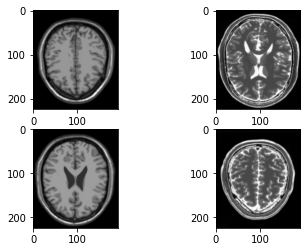

In [ ]:
# visualise couple of image pairs from dataloader

ds = MRIDataset.getDataset(img_paths=paths, out_size=SIZE,batch_size=BATCH_SIZE)

vis_data = ds.take(2)

# initialize image pairs to track during training
sample_t1_data, sample_t2_data = [],[]

#visualise image pairs
n = 1
for x, y in vis_data:
    print(f"x shape: {x.shape}")
    print(f"y shape: {y.shape}")

    x_arr, y_arr = x[0].numpy(), y[0].numpy()


    plt.subplot(2,2,n)
    plt.imshow(x_arr)
    n += 1

    plt.subplot(2,2,n)
    plt.imshow(y_arr)
    n += 1

    # add image pairs to tracking array
    sample_t1_data += [x_arr]
    sample_t2_data += [y_arr]

In [ ]:
# Implementation of Instance Normalization class

class InstanceNormalization(tf.keras.layers.Layer):
    # Initialization of Objects
    def __init__(self, epsilon=1e-5):
        # calling parent's init
        super(InstanceNormalization, self).__init__()
        self.epsilon = epsilon
    
    def build(self, input_shape):
        self.scale = self.add_weight(
            name='scale',
            shape=input_shape[-1:],
            initializer=tf.random_normal_initializer(1., 0.02),
            trainable=True)
        self.offset = self.add_weight(
            name='offset',
            shape=input_shape[-1:],
            initializer='zeros',
            trainable=True)
    
    def call(self, x):
        # Compute Mean and Variance, Axes=[1,2] ensures Instance Normalization
        mean, variance = tf.nn.moments(x, axes=[1, 2], keepdims=True)
        inv = tf.math.rsqrt(variance + self.epsilon)
        normalized = (x - mean) * inv
        return self.scale * normalized + self.offset

In [ ]:
# method to create a downsampling block

def downsample(filters, size, apply_norm=True):
    initializer = tf.random_normal_initializer(0., 0.02)
    result = tf.keras.Sequential()
    # Add Conv2d layer
    result.add(tf.keras.layers.Conv2D(filters, size, strides=2, padding='same',
                                      kernel_initializer=initializer, use_bias=False))
    # Add Normalization layer
    if apply_norm:
        result.add(InstanceNormalization())
    # Add Leaky Relu Activation
    result.add(tf.keras.layers.LeakyReLU())
    return result

In [ ]:
# method to create an upsampling block

def upsample(filters, size, apply_dropout=False):
    initializer = tf.random_normal_initializer(0., 0.02)
    result = tf.keras.Sequential()
    # Add Transposed Conv2d layer
    result.add(tf.keras.layers.Conv2DTranspose(filters, size, strides=2, padding='same',
                                               kernel_initializer=initializer, use_bias=False))
    # Add Normalization Layer
    result.add(InstanceNormalization())
    # Conditionally add Dropout layer
    if apply_dropout:
        result.add(tf.keras.layers.Dropout(0.5))
    # Add Relu Activation Layer
    result.add(tf.keras.layers.ReLU())
    return result

In [ ]:
# method to create a UNet-Based Generator
# Unet Generator is a combination of Convolution + Transposed Convolution Layers

def unet_generator():
    down_stack = [
        downsample(64, 4, False), # (bs, 112, 96, 64)
        downsample(128, 4), # (bs, 56, 48, 128)
        downsample(128, 4), # (bs, 28, 24, 128)
        downsample(256, 4), # (bs, 14, 12, 256)
        downsample(512, 4) # (bs, 7, 6, 512)
    ]
    up_stack = [
        upsample(256, 4, True), # (bs, 14, 12, 256)
        upsample(128, 4, True), # (bs, 28, 24, 128)
        upsample(128, 4), # (bs, 56, 48, 128)
        upsample(64, 4) # (bs, 112, 96, 64)
    ]
    initializer = tf.random_normal_initializer(0., 0.02)
    last = tf.keras.layers.Conv2DTranspose(3, 4, strides=2, padding='same', kernel_initializer=initializer,
                                           activation='tanh') # (bs, 32, 32, 1)
    concat = tf.keras.layers.Concatenate()
    inputs = tf.keras.layers.Input(shape=[224, 192, 3])
    x = inputs
    # Downsampling through the model
    skips = []
    for down in down_stack:
        x = down(x)
        skips.append(x)
    
    skips = reversed(skips[:-1])
    # Upsampling and establishing the skip connections
    for up, skip in zip(up_stack, skips):
        x = up(x)
        x = concat([x, skip])
    x = last(x)
    return tf.keras.Model(inputs=inputs, outputs=x)

### Generators' and Discriminators' nomenclature follows the convention below
#### ----
#### `generator_t1` : generates T2 images using T1 images as input
#### `generator_t2` : generates T1 images using T2 images as input
#### ----
#### `discriminator_t1` : takes T1 images as inputs and validates whether inputs are real or fake
#### `discriminator_t2` : takes T2 images as inputs and validates whether inputs are real or fake
#### ----

In [ ]:
# create generator for T1 and T2 classes 

generator_t1 = unet_generator()
generator_t2 = unet_generator()

In [ ]:
# check size of one of the generator models

generator_t1.summary()

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1 (InputLayer)           [(None, 224, 192, 3  0           []                               
                                )]                                                                
                                                                                                  
 sequential (Sequential)        (None, 112, 96, 64)  3072        ['input_1[0][0]']                
                                                                                                  
 sequential_1 (Sequential)      (None, 56, 48, 128)  131328      ['sequential[0][0]']             
                                                                                                  
 sequential_2 (Sequential)      (None, 28, 24, 128)  262400      ['sequential_1[0][0]']       

In [ ]:
# method to create a UNet-Encoder-Based Discriminator 
# Discriminators only contain Convolutional Layers and no Transposed Convolution is not used 
def discriminator():
    initializer = tf.random_normal_initializer(0., 0.02)
    # add input layer of size (32, 32, 1)
    inp = tf.keras.layers.Input(shape=[224, 192, 3], name='input_image')
    x = inp
    
    # add downsampling step here
    down1 = downsample(64, 4, False)(x) # (bs, 112, 96, 64)
    down2 = downsample(128, 4)(down1) # (bs, 56, 48, 128)
    down3 = downsample(128, 4)(down2) # (bs, 28, 24, 128)
    down4 = downsample(256, 4)(down3) # (bs, 14, 12, 256)
    # add a padding layer here
    zero_pad1 = tf.keras.layers.ZeroPadding2D()(down4) # (bs, 16, 14, 256)
    
    # implement a concrete downsampling layer here
    conv = tf.keras.layers.Conv2D(256, 4, strides=1, kernel_initializer=initializer,
                                  use_bias=False)(zero_pad1) # (bs, 8, 7, 256)
    norm1 = InstanceNormalization()(conv)
    leaky_relu = tf.keras.layers.LeakyReLU()(norm1)
    
    # apply zero padding layer
    zero_pad2 = tf.keras.layers.ZeroPadding2D()(leaky_relu) # (bs, 10, 9, 256)
    
    # add a last pure 2D Convolution layer
    last = tf.keras.layers.Conv2D(1, 4, strides=1, kernel_initializer=initializer)(zero_pad2) # (bs, 6, 6, 1)
    return tf.keras.Model(inputs=inp, outputs=last)

In [ ]:
# create discriminator for T1 and T2 classes

discriminator_t1 = discriminator()
discriminator_t2 = discriminator()

In [ ]:
# check size of one of the discriminator models

discriminator_t1.summary()

Model: "model_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_image (InputLayer)    [(None, 224, 192, 3)]     0         
                                                                 
 sequential_18 (Sequential)  (None, 112, 96, 64)       3072      
                                                                 
 sequential_19 (Sequential)  (None, 56, 48, 128)       131328    
                                                                 
 sequential_20 (Sequential)  (None, 28, 24, 128)       262400    
                                                                 
 sequential_21 (Sequential)  (None, 14, 12, 256)       524800    
                                                                 
 zero_padding2d (ZeroPadding  (None, 16, 14, 256)      0         
 2D)                                                             
                                                           

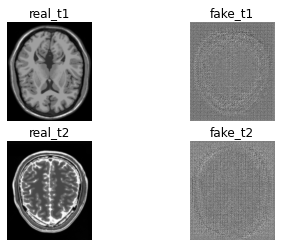

In [ ]:
# visualise real images and predictions from untrained generators

# get an image pair from dataset
pred_vis = ds.take(1)

n = 1
for real_t1,real_t2 in pred_vis:
    # get predictions from generators t1 and t2
    fake_t2 = generator_t1(real_t1)
    fake_t1 = generator_t2(real_t2)

    img_map = {
        "real_t1": real_t1,
        "fake_t1": fake_t1,
        "real_t2": real_t2,
        "fake_t2": fake_t2
    }

    # plot real and predicted images
    i = 0
    for img_key in img_map:
        plt.subplot(2, 2, i+1)
        plt.title(img_key)
        plt.imshow(img_map[img_key][0].numpy()[:, :, 0], cmap='gray')
        plt.axis('off')
        i += 1

    plt.show()
    

#### Define losses for generator and discriminator models

In [ ]:
# define a loss object for binary cross entropy

loss_obj = tf.keras.losses.BinaryCrossentropy(from_logits=True)

In [ ]:
# method to compute discriminator loss
def discriminator_loss(real, generated):
    real_loss = loss_obj(tf.ones_like(real), real)
    generated_loss = loss_obj(tf.zeros_like(generated), generated)
    total_disc_loss = real_loss + generated_loss
    return total_disc_loss * 0.5 # mean of losses

In [ ]:
# method to compute generator loss
def generator_loss(generated):
    return loss_obj(tf.ones_like(generated), generated)

In [ ]:
# method to compute cyclic loss
def calc_cycle_loss(real_image, cycled_image):
    loss1 = tf.reduce_mean(tf.abs(real_image - cycled_image))
    return 10.0 * loss1

In [ ]:
# method to compute identity loss
def identity_loss(real_image, same_image):
    loss = tf.reduce_mean(tf.abs(real_image - same_image))
    return 0.5*loss

In [ ]:
# set batch size for training and reinitialize dataloader

BATCH_SIZE = 32

train_ds = MRIDataset.getDataset(img_paths=paths, out_size=SIZE,batch_size=BATCH_SIZE)

Number of samples : 1978


In [ ]:
# create optimizer instances for T1 and T2 generators and discriminators

generator_t1_optimizer = tf.keras.optimizers.Adam(2e-4, beta_1=0.5)
generator_t2_optimizer = tf.keras.optimizers.Adam(2e-4, beta_1=0.5)

discriminator_t1_optimizer = tf.keras.optimizers.Adam(2e-4, beta_1=0.5)
discriminator_t2_optimizer = tf.keras.optimizers.Adam(2e-4, beta_1=0.5)

In [ ]:
# setup checkpoint manager to checkpoint best model weights and optimizers during training

checkpoint_path = "./Trained_Model"

ckpt = tf.train.Checkpoint(generator_t1=generator_t1,
                           generator_t2=generator_t2,
                           discriminator_t1=discriminator_t1,
                           discriminator_t2=discriminator_t2,
                           generator_t1_optimizer=generator_t1_optimizer,
                           generator_t2_optimizer=generator_t2_optimizer,
                           discriminator_t1_optimizer=discriminator_t1_optimizer,
                           discriminator_t2_optimizer=discriminator_t2_optimizer)

ckpt_manager = tf.train.CheckpointManager(ckpt, checkpoint_path, max_to_keep=3)

# if a checkpoint exists, restore the latest checkpoint.
if ckpt_manager.latest_checkpoint:
    ckpt.restore(ckpt_manager.latest_checkpoint)
    print ('Latest checkpoint restored!!')

In [ ]:
# method to plot and save tracked images after each training epoch 
def generate_images(model1, test_input1, model2, test_input2):
    prediction1 = model1(test_input1)
    prediction2 = model2(test_input2)
    plt.figure(figsize=(8, 4))
    display_list = [test_input1[0], prediction1[0], test_input2[0], prediction2[0]]
    title = ['Input Image', 'Predicted Image', 'Input Image', 'Predicted Image']
    for i in range(4):
        plt.subplot(1, 4, i+1)
        plt.title(title[i])
        plt.imshow(display_list[i].numpy()[:, :, 0], cmap='gray')
        plt.axis('off')

    plt.savefig('image_at_epoch_{:04d}.png'.format(epoch))
    plt.show()

In [ ]:
# method to perform one training step for MRI T1-T2 Style Transfer GAN

@tf.function
def train_step(real_t1, real_t2):
    # persistent is set to True because the tape is used more than
    # once to calculate the gradients.
    with tf.GradientTape(persistent=True) as tape:
        # Generator T1 translates T1 -> T2
        # Generator T2 translates T2 -> T1

        fake_t2 = generator_t1(real_t1, training=True)
        cycled_t1 = generator_t2(fake_t2, training=True)
        
        fake_t1 = generator_t2(real_t2, training=True)
        cycled_t2 = generator_t1(fake_t1, training=True)
        
        # same_t1 and same_t2 are used for identity loss.
        same_t1 = generator_t2(real_t1, training=True)
        same_t2 = generator_t1(real_t2, training=True)
        
        # Discriminator T1 discriminates for real and fake T1 samples
        # Discriminator T2 discriminates for real and fake T2 samples

        disc_real_t1 = discriminator_t1(real_t1, training=True)
        disc_real_t2 = discriminator_t2(real_t2, training=True)
        
        disc_fake_t1 = discriminator_t1(fake_t1, training=True)
        disc_fake_t2 = discriminator_t2(fake_t2, training=True)
        
        # calculate the loss
        gen_t1_loss = generator_loss(disc_fake_t2)
        gen_t2_loss = generator_loss(disc_fake_t1)
        
        total_cycle_loss = calc_cycle_loss(real_t1, cycled_t1) + calc_cycle_loss(real_t2, cycled_t2)
        
        # Total generator loss = BCE loss + cycle loss + identity loss
        total_gen_t1_loss = gen_t1_loss + total_cycle_loss + identity_loss(real_t1, same_t1)
        total_gen_t2_loss = gen_t2_loss + total_cycle_loss + identity_loss(real_t2, same_t2)
        
        # Discriminator's loss
        disc_t1_loss = discriminator_loss(disc_real_t1, disc_fake_t1)
        disc_t2_loss = discriminator_loss(disc_real_t2, disc_fake_t2)
        
    # Calculate the gradients for generator and discriminator
    generator_t1_gradients = tape.gradient(total_gen_t1_loss, generator_t1.trainable_variables)
    generator_t2_gradients = tape.gradient(total_gen_t2_loss, generator_t2.trainable_variables)
    
    discriminator_t1_gradients = tape.gradient(disc_t1_loss, discriminator_t1.trainable_variables)
    discriminator_t2_gradients = tape.gradient(disc_t2_loss, discriminator_t2.trainable_variables)
    
    # Apply the gradients to the optimizer
    generator_t1_optimizer.apply_gradients(zip(generator_t1_gradients, generator_t1.trainable_variables))
    generator_t2_optimizer.apply_gradients(zip(generator_t2_gradients, generator_t2.trainable_variables))
    
    discriminator_t1_optimizer.apply_gradients(zip(discriminator_t1_gradients, discriminator_t1.trainable_variables))
    discriminator_t2_optimizer.apply_gradients(zip(discriminator_t2_gradients, discriminator_t2.trainable_variables))

62it [01:40,  1.62s/it]


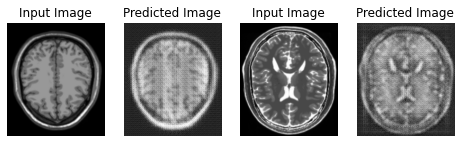

Saving checkpoint for epoch 1 at ./Trained_Model/ckpt-1


62it [01:11,  1.15s/it]


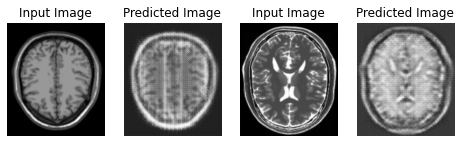

Saving checkpoint for epoch 2 at ./Trained_Model/ckpt-2


62it [01:11,  1.15s/it]


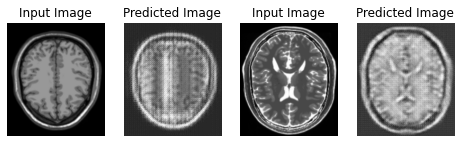

Saving checkpoint for epoch 3 at ./Trained_Model/ckpt-3


62it [01:11,  1.15s/it]


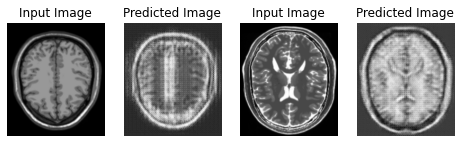

Saving checkpoint for epoch 4 at ./Trained_Model/ckpt-4


62it [01:11,  1.15s/it]


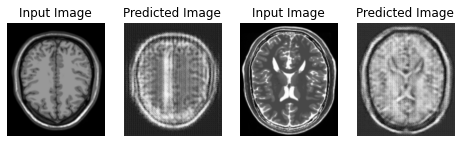

Saving checkpoint for epoch 5 at ./Trained_Model/ckpt-5


62it [01:11,  1.16s/it]


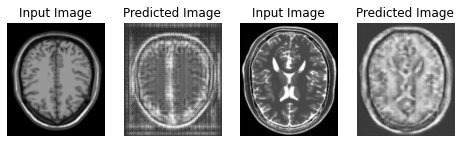

Saving checkpoint for epoch 6 at ./Trained_Model/ckpt-6


62it [01:11,  1.15s/it]


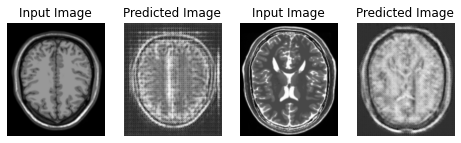

Saving checkpoint for epoch 7 at ./Trained_Model/ckpt-7


62it [01:11,  1.15s/it]


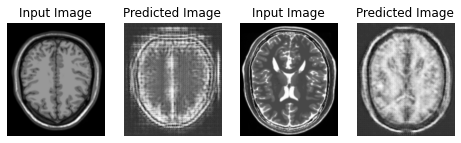

Saving checkpoint for epoch 8 at ./Trained_Model/ckpt-8


62it [01:11,  1.15s/it]


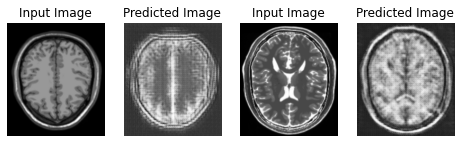

Saving checkpoint for epoch 9 at ./Trained_Model/ckpt-9


62it [01:11,  1.16s/it]


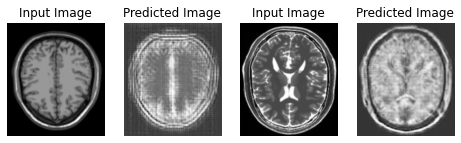

Saving checkpoint for epoch 10 at ./Trained_Model/ckpt-10


62it [01:11,  1.15s/it]


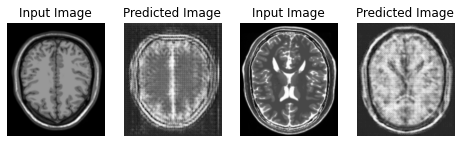

Saving checkpoint for epoch 11 at ./Trained_Model/ckpt-11


62it [01:11,  1.15s/it]


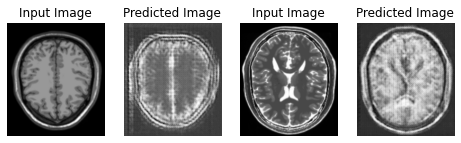

Saving checkpoint for epoch 12 at ./Trained_Model/ckpt-12


62it [01:11,  1.15s/it]


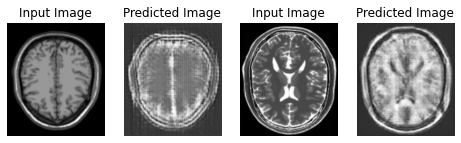

Saving checkpoint for epoch 13 at ./Trained_Model/ckpt-13


62it [01:11,  1.15s/it]


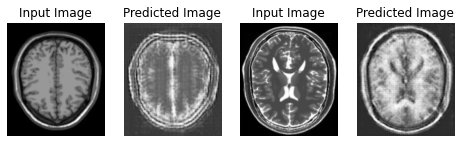

Saving checkpoint for epoch 14 at ./Trained_Model/ckpt-14


62it [01:11,  1.15s/it]


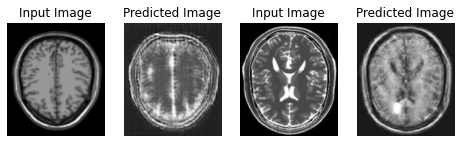

Saving checkpoint for epoch 15 at ./Trained_Model/ckpt-15


62it [01:11,  1.16s/it]


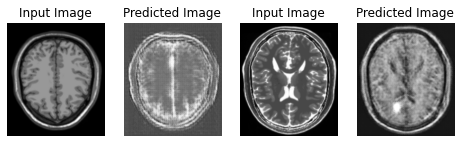

Saving checkpoint for epoch 16 at ./Trained_Model/ckpt-16


62it [01:11,  1.15s/it]


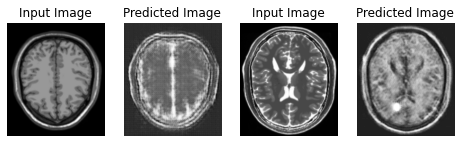

Saving checkpoint for epoch 17 at ./Trained_Model/ckpt-17


62it [01:11,  1.16s/it]


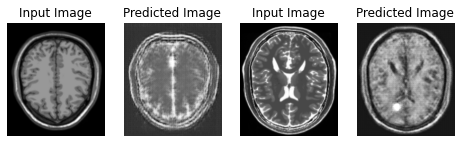

Saving checkpoint for epoch 18 at ./Trained_Model/ckpt-18


62it [01:11,  1.15s/it]


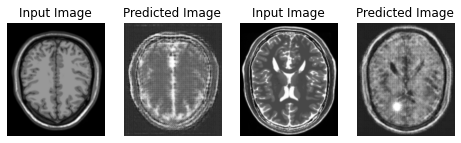

Saving checkpoint for epoch 19 at ./Trained_Model/ckpt-19


62it [01:11,  1.15s/it]


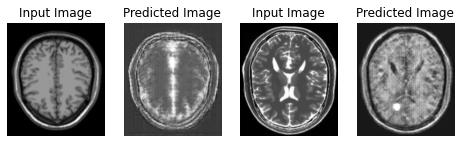

Saving checkpoint for epoch 20 at ./Trained_Model/ckpt-20


62it [01:11,  1.16s/it]


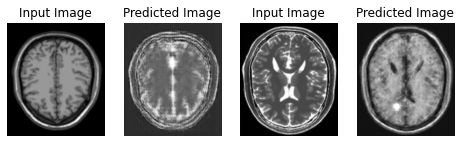

Saving checkpoint for epoch 21 at ./Trained_Model/ckpt-21


62it [01:11,  1.15s/it]


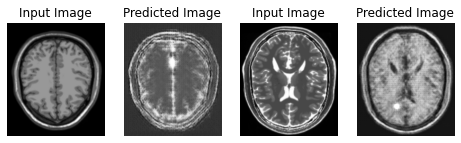

Saving checkpoint for epoch 22 at ./Trained_Model/ckpt-22


62it [01:11,  1.15s/it]


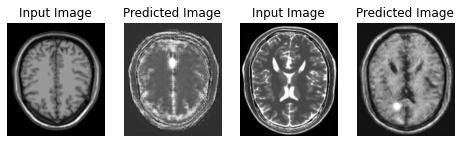

Saving checkpoint for epoch 23 at ./Trained_Model/ckpt-23


62it [01:11,  1.15s/it]


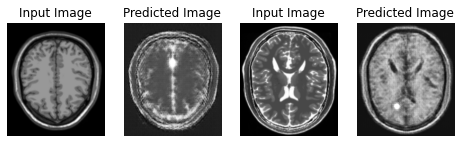

Saving checkpoint for epoch 24 at ./Trained_Model/ckpt-24


62it [01:11,  1.15s/it]


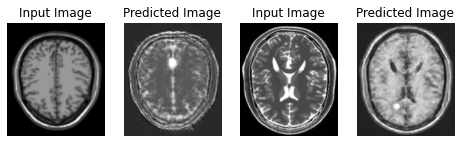

Saving checkpoint for epoch 25 at ./Trained_Model/ckpt-25


62it [01:11,  1.15s/it]


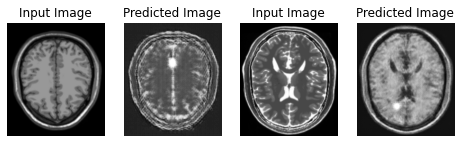

Saving checkpoint for epoch 26 at ./Trained_Model/ckpt-26


62it [01:11,  1.15s/it]


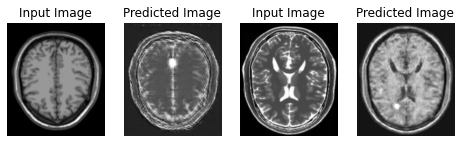

Saving checkpoint for epoch 27 at ./Trained_Model/ckpt-27


62it [01:11,  1.15s/it]


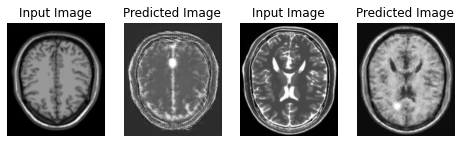

Saving checkpoint for epoch 28 at ./Trained_Model/ckpt-28


62it [01:11,  1.15s/it]


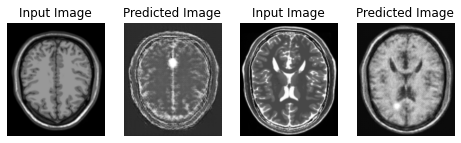

Saving checkpoint for epoch 29 at ./Trained_Model/ckpt-29


62it [01:11,  1.15s/it]


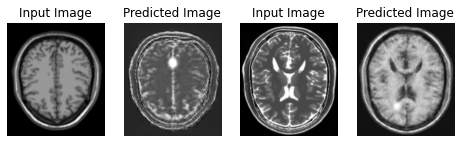

Saving checkpoint for epoch 30 at ./Trained_Model/ckpt-30


62it [01:11,  1.15s/it]


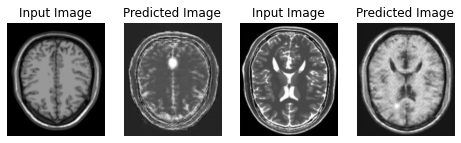

Saving checkpoint for epoch 31 at ./Trained_Model/ckpt-31


62it [01:11,  1.15s/it]


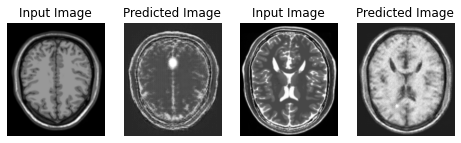

Saving checkpoint for epoch 32 at ./Trained_Model/ckpt-32


62it [01:11,  1.15s/it]


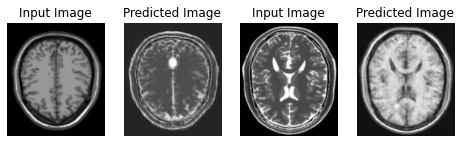

Saving checkpoint for epoch 33 at ./Trained_Model/ckpt-33


62it [01:11,  1.15s/it]


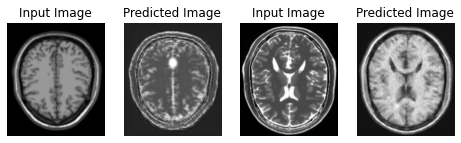

Saving checkpoint for epoch 34 at ./Trained_Model/ckpt-34


62it [01:11,  1.15s/it]


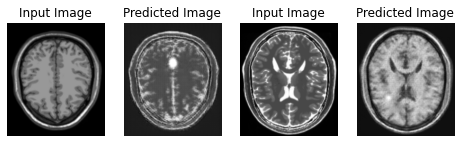

Saving checkpoint for epoch 35 at ./Trained_Model/ckpt-35


62it [01:11,  1.15s/it]


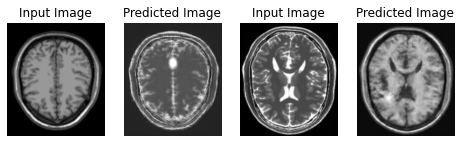

Saving checkpoint for epoch 36 at ./Trained_Model/ckpt-36


62it [01:11,  1.15s/it]


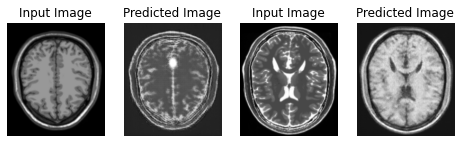

Saving checkpoint for epoch 37 at ./Trained_Model/ckpt-37


62it [01:11,  1.15s/it]


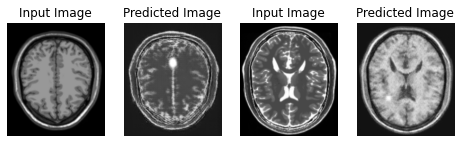

Saving checkpoint for epoch 38 at ./Trained_Model/ckpt-38


62it [01:11,  1.16s/it]


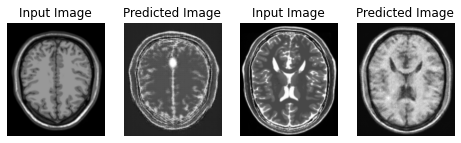

Saving checkpoint for epoch 39 at ./Trained_Model/ckpt-39


62it [01:11,  1.15s/it]


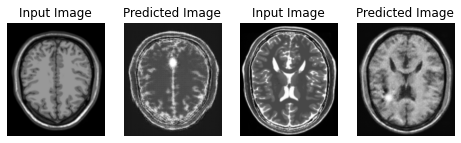

Saving checkpoint for epoch 40 at ./Trained_Model/ckpt-40


62it [01:11,  1.15s/it]


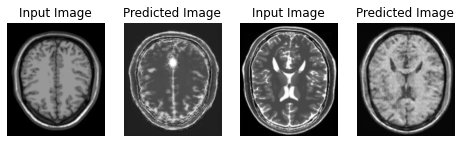

Saving checkpoint for epoch 41 at ./Trained_Model/ckpt-41


62it [01:11,  1.15s/it]


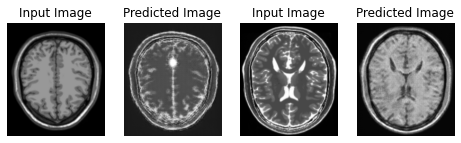

Saving checkpoint for epoch 42 at ./Trained_Model/ckpt-42


62it [01:11,  1.15s/it]


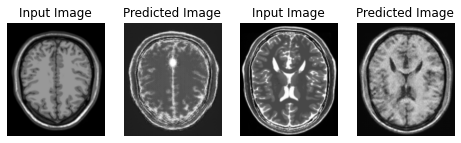

Saving checkpoint for epoch 43 at ./Trained_Model/ckpt-43


62it [01:11,  1.15s/it]


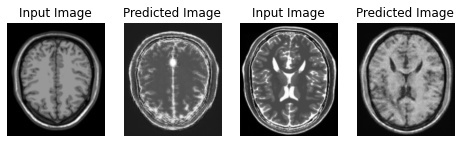

Saving checkpoint for epoch 44 at ./Trained_Model/ckpt-44


62it [01:11,  1.15s/it]


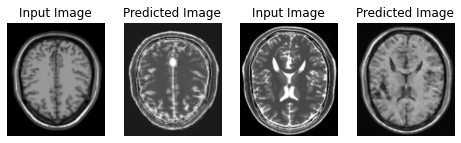

Saving checkpoint for epoch 45 at ./Trained_Model/ckpt-45


62it [01:11,  1.15s/it]


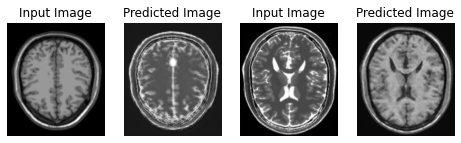

Saving checkpoint for epoch 46 at ./Trained_Model/ckpt-46


62it [01:11,  1.15s/it]


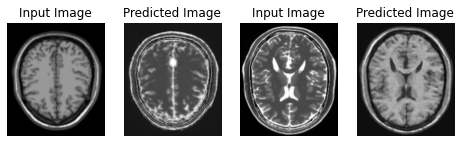

Saving checkpoint for epoch 47 at ./Trained_Model/ckpt-47


62it [01:11,  1.15s/it]


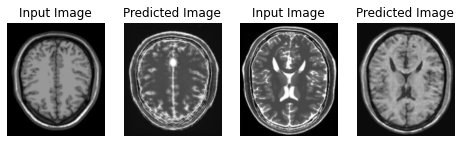

Saving checkpoint for epoch 48 at ./Trained_Model/ckpt-48


62it [01:11,  1.15s/it]


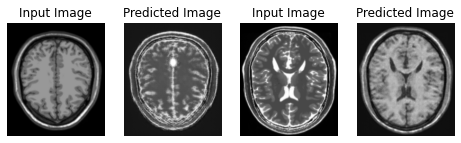

Saving checkpoint for epoch 49 at ./Trained_Model/ckpt-49


62it [01:11,  1.15s/it]


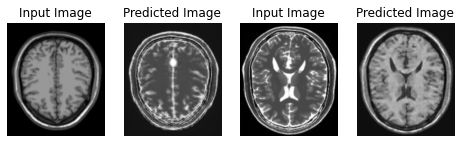

Saving checkpoint for epoch 50 at ./Trained_Model/ckpt-50


62it [01:11,  1.15s/it]


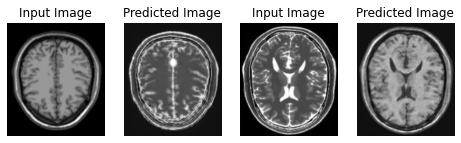

Saving checkpoint for epoch 51 at ./Trained_Model/ckpt-51


62it [01:11,  1.15s/it]


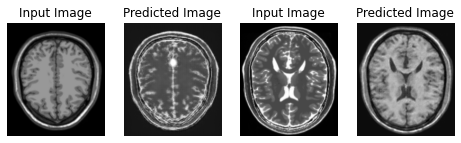

Saving checkpoint for epoch 52 at ./Trained_Model/ckpt-52


62it [01:11,  1.15s/it]


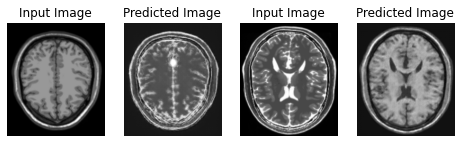

Saving checkpoint for epoch 53 at ./Trained_Model/ckpt-53


62it [01:11,  1.15s/it]


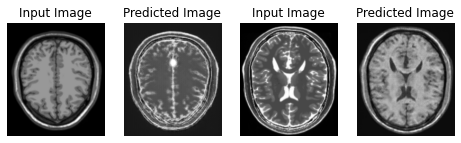

Saving checkpoint for epoch 54 at ./Trained_Model/ckpt-54


62it [01:11,  1.15s/it]


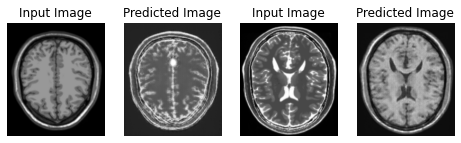

Saving checkpoint for epoch 55 at ./Trained_Model/ckpt-55


62it [01:11,  1.15s/it]


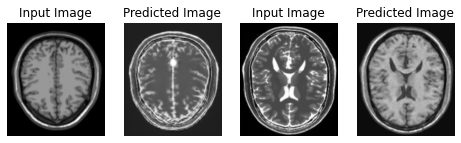

Saving checkpoint for epoch 56 at ./Trained_Model/ckpt-56


62it [01:11,  1.15s/it]


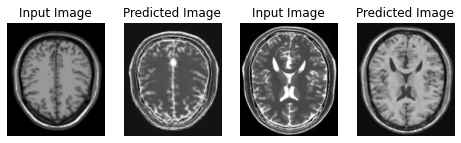

Saving checkpoint for epoch 57 at ./Trained_Model/ckpt-57


62it [01:11,  1.15s/it]


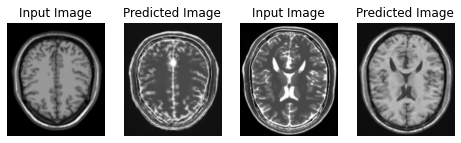

Saving checkpoint for epoch 58 at ./Trained_Model/ckpt-58


62it [01:11,  1.15s/it]


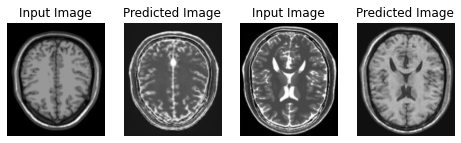

Saving checkpoint for epoch 59 at ./Trained_Model/ckpt-59


62it [01:11,  1.15s/it]


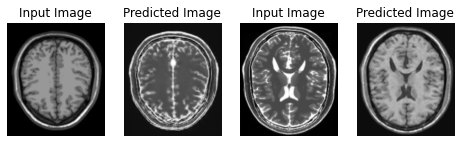

Saving checkpoint for epoch 60 at ./Trained_Model/ckpt-60


62it [01:11,  1.15s/it]


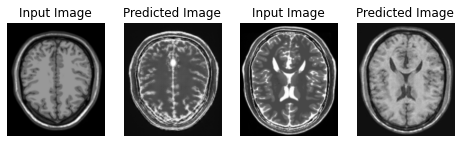

Saving checkpoint for epoch 61 at ./Trained_Model/ckpt-61


62it [01:11,  1.15s/it]


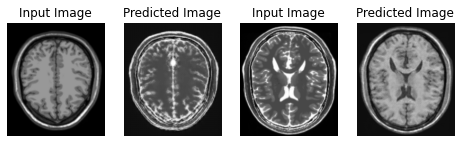

Saving checkpoint for epoch 62 at ./Trained_Model/ckpt-62


62it [01:11,  1.15s/it]


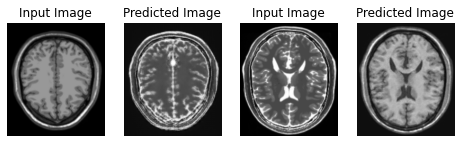

Saving checkpoint for epoch 63 at ./Trained_Model/ckpt-63


62it [01:11,  1.15s/it]


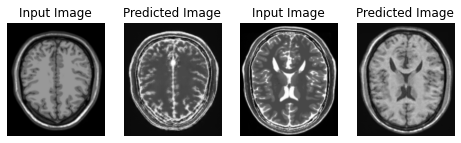

Saving checkpoint for epoch 64 at ./Trained_Model/ckpt-64


62it [01:11,  1.15s/it]


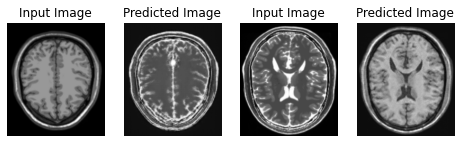

Saving checkpoint for epoch 65 at ./Trained_Model/ckpt-65


62it [01:11,  1.15s/it]


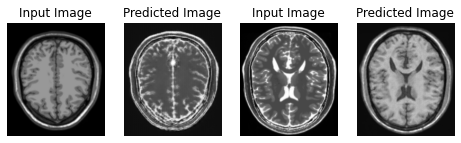

Saving checkpoint for epoch 66 at ./Trained_Model/ckpt-66


62it [01:11,  1.15s/it]


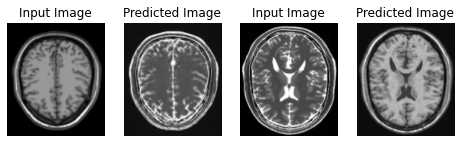

Saving checkpoint for epoch 67 at ./Trained_Model/ckpt-67


62it [01:11,  1.15s/it]


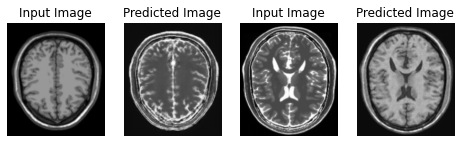

Saving checkpoint for epoch 68 at ./Trained_Model/ckpt-68


62it [01:11,  1.15s/it]


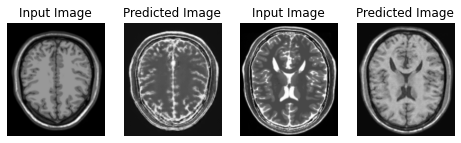

Saving checkpoint for epoch 69 at ./Trained_Model/ckpt-69


62it [01:11,  1.15s/it]


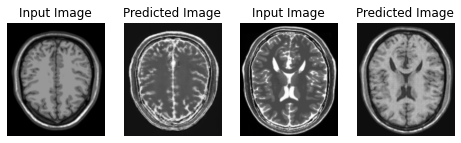

Saving checkpoint for epoch 70 at ./Trained_Model/ckpt-70


62it [01:11,  1.15s/it]


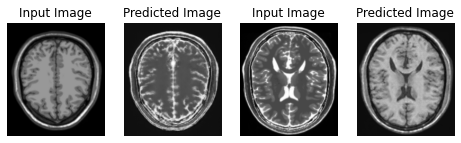

Saving checkpoint for epoch 71 at ./Trained_Model/ckpt-71


62it [01:11,  1.15s/it]


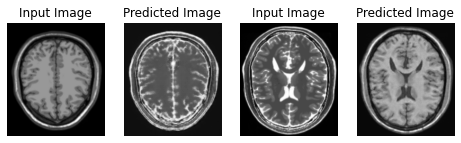

Saving checkpoint for epoch 72 at ./Trained_Model/ckpt-72


62it [01:11,  1.15s/it]


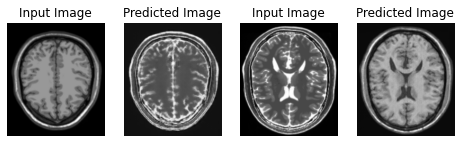

Saving checkpoint for epoch 73 at ./Trained_Model/ckpt-73


62it [01:11,  1.16s/it]


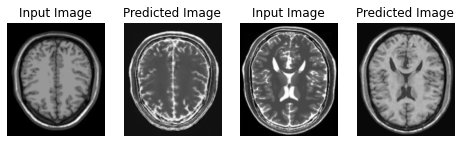

Saving checkpoint for epoch 74 at ./Trained_Model/ckpt-74


62it [01:11,  1.15s/it]


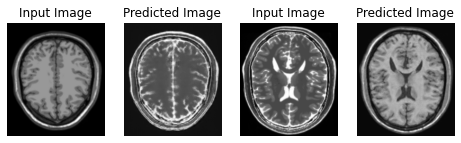

Saving checkpoint for epoch 75 at ./Trained_Model/ckpt-75


62it [01:11,  1.15s/it]


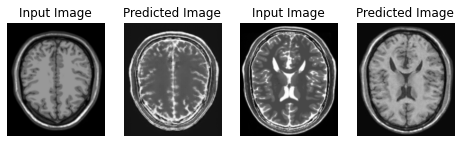

Saving checkpoint for epoch 76 at ./Trained_Model/ckpt-76


62it [01:11,  1.16s/it]


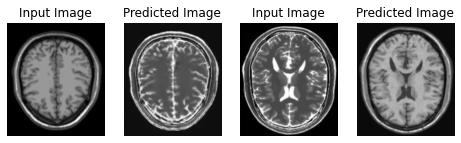

Saving checkpoint for epoch 77 at ./Trained_Model/ckpt-77


62it [01:11,  1.15s/it]


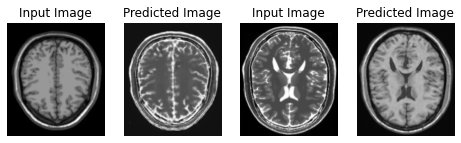

Saving checkpoint for epoch 78 at ./Trained_Model/ckpt-78


62it [01:11,  1.15s/it]


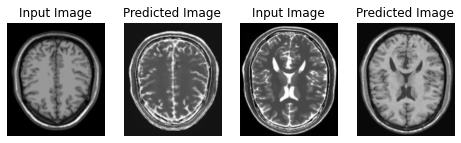

Saving checkpoint for epoch 79 at ./Trained_Model/ckpt-79


62it [01:11,  1.15s/it]


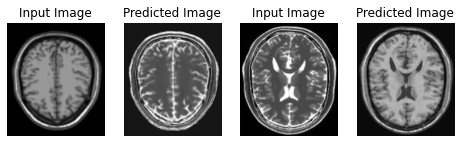

Saving checkpoint for epoch 80 at ./Trained_Model/ckpt-80


62it [01:11,  1.15s/it]


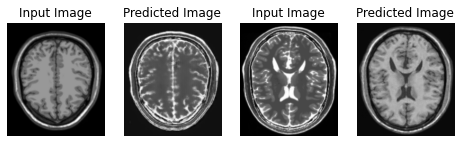

Saving checkpoint for epoch 81 at ./Trained_Model/ckpt-81


62it [01:11,  1.15s/it]


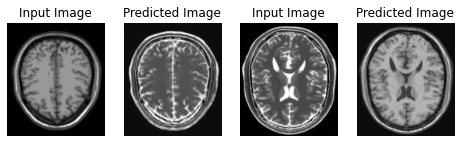

Saving checkpoint for epoch 82 at ./Trained_Model/ckpt-82


62it [01:11,  1.15s/it]


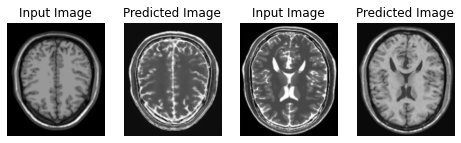

Saving checkpoint for epoch 83 at ./Trained_Model/ckpt-83


62it [01:11,  1.15s/it]


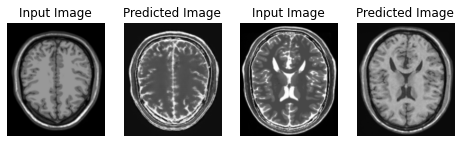

Saving checkpoint for epoch 84 at ./Trained_Model/ckpt-84


62it [01:11,  1.15s/it]


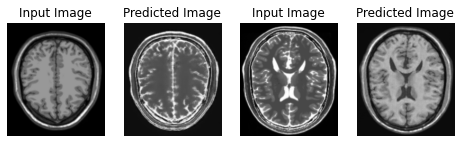

Saving checkpoint for epoch 85 at ./Trained_Model/ckpt-85


62it [01:11,  1.15s/it]


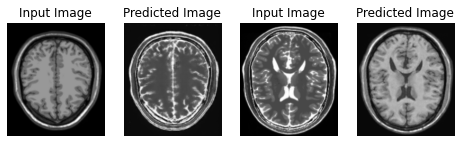

Saving checkpoint for epoch 86 at ./Trained_Model/ckpt-86


62it [01:11,  1.15s/it]


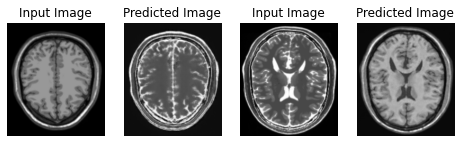

Saving checkpoint for epoch 87 at ./Trained_Model/ckpt-87


62it [01:11,  1.15s/it]


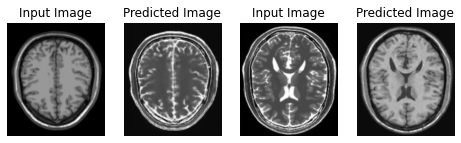

Saving checkpoint for epoch 88 at ./Trained_Model/ckpt-88


62it [01:11,  1.15s/it]


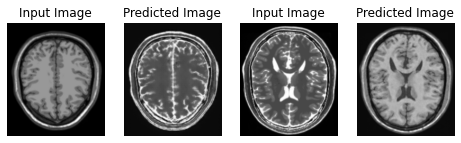

Saving checkpoint for epoch 89 at ./Trained_Model/ckpt-89


62it [01:11,  1.15s/it]


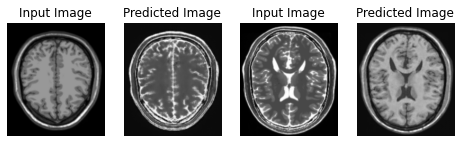

Saving checkpoint for epoch 90 at ./Trained_Model/ckpt-90


62it [01:11,  1.15s/it]


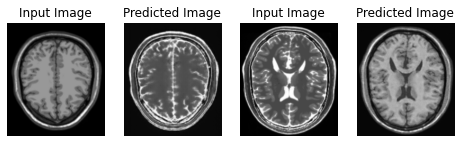

Saving checkpoint for epoch 91 at ./Trained_Model/ckpt-91


62it [01:11,  1.15s/it]


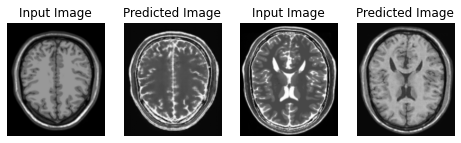

Saving checkpoint for epoch 92 at ./Trained_Model/ckpt-92


62it [01:11,  1.15s/it]


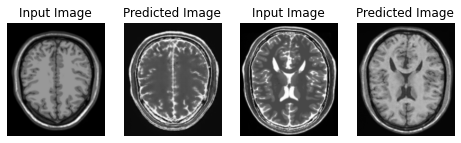

Saving checkpoint for epoch 93 at ./Trained_Model/ckpt-93


62it [01:11,  1.15s/it]


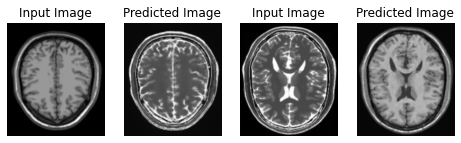

Saving checkpoint for epoch 94 at ./Trained_Model/ckpt-94


62it [01:11,  1.15s/it]


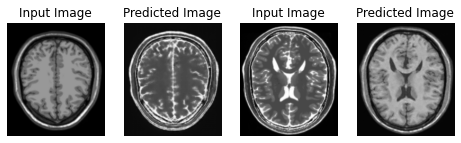

Saving checkpoint for epoch 95 at ./Trained_Model/ckpt-95


62it [01:11,  1.15s/it]


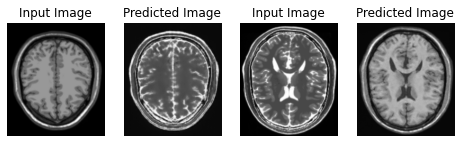

Saving checkpoint for epoch 96 at ./Trained_Model/ckpt-96


62it [01:11,  1.15s/it]


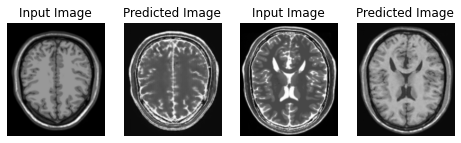

Saving checkpoint for epoch 97 at ./Trained_Model/ckpt-97


62it [01:11,  1.15s/it]


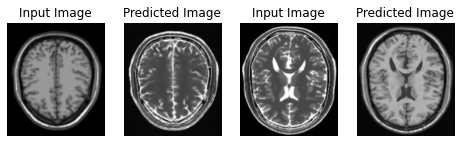

Saving checkpoint for epoch 98 at ./Trained_Model/ckpt-98


62it [01:11,  1.15s/it]


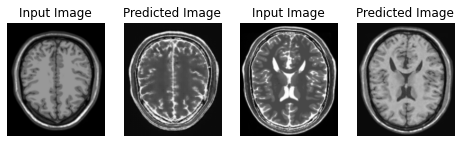

Saving checkpoint for epoch 99 at ./Trained_Model/ckpt-99


62it [01:11,  1.15s/it]


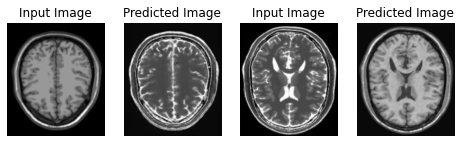

Saving checkpoint for epoch 100 at ./Trained_Model/ckpt-100


In [ ]:
# create constant tf for tracked images arrays
sample_t1_data = tf.constant(np.concatenate([np.expand_dims(data, axis=0) for data in sample_t1_data], axis=0))
sample_t2_data = tf.constant(np.concatenate([np.expand_dims(data, axis=0) for data in sample_t2_data], axis=0))

# model training loop 
# for every epoch
for epoch in range(1, EPOCHS+1):
    
    # for every image pair batch in training dataloader
    for image_t1, image_t2 in tqdm.tqdm(train_ds):
        # perform one training setop
        train_step(image_t1, image_t2)
    
    # generate images to be tracked
    generate_images(generator_t1, sample_t1_data, generator_t2, sample_t2_data)
    
    # save checkpoint
    ckpt_save_path = ckpt_manager.save()
    
    print('Saving checkpoint for epoch', epoch, 'at', ckpt_save_path)

### combine tracked images to create a gif

#### `Note:` tensorflow docs embeds gif in jupyter notebook only during code execution. downloaded/submitted code does not have this encoding. For review purpose, I ll be providing tracked images gif as part of the submission zip 

In [ ]:
# combine tracked images to create a GIF

anim_file = 'mri_real_pred_progress.gif'

with imageio.get_writer(anim_file, mode='I') as writer:
  filenames = glob.glob('image*.png')
  filenames = sorted(filenames)
  for filename in filenames:
    image = imageio.imread(filename)
    writer.append_data(image)
  image = imageio.imread(filename)
  writer.append_data(image)

In [ ]:
# install tensorflow docs to embed tracked image gif to notebook
# note: this works only during execution. downloaded/submitted notebooks do not have gif embedded
!pip install git+https://github.com/tensorflow/docs

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
  Cloning https://github.com/tensorflow/docs to /tmp/pip-req-build-o2w02um6
  Running command git clone -q https://github.com/tensorflow/docs /tmp/pip-req-build-o2w02um6
  Created wheel for tensorflow-docs: filename=tensorflow_docs-0.0.0.dev0-py3-none-any.whl size=184182 sha256=e340b937010d92206bdd686fe1ec08bb5550cdd079dffcbddfc4db13f15bc0a1
  Stored in directory: /tmp/pip-ephem-wheel-cache-hv573ebb/wheels/cc/c4/d8/5341e93b6376c5c929c49469fce21155eb69cef1a4da4ce32c
Successfully built tensorflow-docs



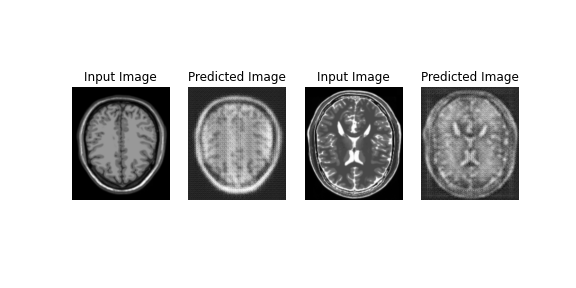

In [ ]:
# embed gif in notebook

import tensorflow_docs.vis.embed as embed
embed.embed_file(anim_file)

In [ ]:
# zip checkpoint directory for download
# note: checkpoint zip is too large(560M) to be added submission zip
# please contact me if checkpoint weights are required  

!zip -r /content/checkpoints.zip  /content/Trained_Model

  adding: content/Trained_Model/ (stored 0%)
  adding: content/Trained_Model/ckpt-98.data-00000-of-00001 (deflated 9%)
  adding: content/Trained_Model/ckpt-100.data-00000-of-00001 (deflated 9%)
  adding: content/Trained_Model/ckpt-98.index (deflated 81%)
  adding: content/Trained_Model/ckpt-99.data-00000-of-00001 (deflated 9%)
  adding: content/Trained_Model/ckpt-100.index (deflated 81%)
  adding: content/Trained_Model/checkpoint (deflated 63%)
  adding: content/Trained_Model/ckpt-99.index (deflated 81%)


In [ ]:
# collate tracked images and zip the same for download

!zip /content/images.zip /content/*.png

  adding: content/image_at_epoch_0001.png (deflated 5%)
  adding: content/image_at_epoch_0002.png (deflated 6%)
  adding: content/image_at_epoch_0003.png (deflated 6%)
  adding: content/image_at_epoch_0004.png (deflated 6%)
  adding: content/image_at_epoch_0005.png (deflated 6%)
  adding: content/image_at_epoch_0006.png (deflated 5%)
  adding: content/image_at_epoch_0007.png (deflated 6%)
  adding: content/image_at_epoch_0008.png (deflated 6%)
  adding: content/image_at_epoch_0009.png (deflated 6%)
  adding: content/image_at_epoch_0010.png (deflated 6%)
  adding: content/image_at_epoch_0011.png (deflated 5%)
  adding: content/image_at_epoch_0012.png (deflated 5%)
  adding: content/image_at_epoch_0013.png (deflated 6%)
  adding: content/image_at_epoch_0014.png (deflated 5%)
  adding: content/image_at_epoch_0015.png (deflated 6%)
  adding: content/image_at_epoch_0016.png (deflated 6%)
  adding: content/image_at_epoch_0017.png (deflated 6%)
  adding: content/image_at_epoch_0018.png (defla